In [1]:
# import prepared data
from prepare_zillow import prepare_zillow_without_outliers
from summarize import df_summary

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Wrangling
import numpy as np
import pandas as pd

# Visualizing
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import plotly.plotly as py
import plotly.tools as tls
import cufflinks as cf
print('cufflinks version ', cf.__version__)
import plotly.graph_objs as go
import sys # used in command to make entire array print by default

# Modeling
from scipy.spatial.distance import cdist
from scipy.cluster.vq import kmeans2, whiten
from sklearn.cluster import KMeans
from sklearn import metrics
import math
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
from scipy import stats
from scipy.stats import ttest_ind
from pandas.tools.plotting import scatter_matrix
from matplotlib.ticker import FormatStrFormatter


# Though the following import is not directly being used, it is required
# for 3D projection to work
from mpl_toolkits.mplot3d import Axes3D
pd.options.display.float_format = '{:20,.2f}'.format


# ignore warnings
import warnings
warnings.filterwarnings("ignore")

cufflinks version  0.15


In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
# makes entire array print by default, can add [:##] to end to set length
np.set_printoptions(threshold=sys.maxsize)

In [4]:
df = prepare_zillow_without_outliers()
df.sample(3)
# Kept only the single unit properties, per Michael's function.
# Dropped columns with more than 45% data missing in a column
# and dropped rows with more than 25% data missing in the row.
# Filled missing calculatedbathnbr and fullbathcnt with bathroomcnt
# then went back and dropped all rows with ANY missing values.
# Converted the datatypes of the numeric columns to int and category as appropriate.

Reading Zillow data...
Preparing and cleaning Zillow data...
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)
[33039.95776043]
[[-0.00962733]]
Univariate - final_exam = b + m * exam1
    y-intercept (b): 33039.96
    coefficient (m): -0.01

Zillow data is now ready for analysis!


,logerror,bath,bed,bedbath,totsqft,finsqft,year,land_tax_val,struct_tax_val,land_struct_tax_val,...,lotsize,bldgqualtype,hvac,landusecode,landusedesc,propzone,rawcensus,census,assessmentyr,transdate
parcelid,,,,,,,,,,,,,,,,,,,,,
10833240,0.00,0.22,0.10,0.32,0.09,0.09,0.74,0.07,0.02,0.09,...,0.08,8.00,Central,010C,Condominium,LARD2,60371321,60371321023005,2016,2017-02-03
10773389,0.16,0.00,0.10,0.10,0.03,0.03,0.67,0.02,0.01,0.03,...,0.11,4.00,Central,010E,Condominium,LAR3,60371347,60371347202009,2015,2016-06-16
11806100,-0.07,0.00,0.10,0.10,0.05,0.05,0.32,0.01,0.00,0.01,...,0.00,7.00,Floor/Wall,0100,Single Family Residential,LAR2,60372051,60372051201006,2015,2016-08-09


In [5]:
len(df.columns)

28

In [6]:
df.select_dtypes('object').columns

Index(['hvac', 'landusecode', 'landusedesc', 'propzone', 'transdate'], dtype='object')

Encode the hvac, landusecode, landusedesc, propzone, and transdate columns

In [7]:
def encode_col(df, cols):
    for col in cols:
        encoder = LabelEncoder()
        encoder.fit(df[col])
        df[col] = encoder.transform(df[col])
    return encoder, df

encoder, df_features = encode_col(df, cols=['hvac', 'landusecode', 'landusedesc', 'propzone', 'transdate'])
df_features.head()

,logerror,bath,bed,bedbath,totsqft,finsqft,year,land_tax_val,struct_tax_val,land_struct_tax_val,...,lotsize,bldgqualtype,hvac,landusecode,landusedesc,propzone,rawcensus,census,assessmentyr,transdate
parcelid,,,,,,,,,,,,,,,,,,,,,
11016594,0.03,0.11,0.20,0.31,0.10,0.10,0.59,0.09,0.02,0.11,...,0.00,4.00,0,1,5,666,60371066,60371066461001,2015,0
12098116,-0.00,0.22,0.10,0.32,0.14,0.14,0.45,0.02,0.01,0.03,...,0.01,4.00,0,1,5,1620,60374638,60374638003004,2015,0
12643413,0.02,0.11,0.10,0.21,0.03,0.03,0.79,0.03,0.02,0.05,...,0.04,4.00,0,9,0,643,60372963,60372963002002,2015,1
11509835,-0.27,0.33,0.30,0.63,0.21,0.21,0.75,0.63,0.12,0.75,...,0.00,1.00,0,1,5,564,60376210,60376210044006,2015,1
12286022,0.04,0.00,0.10,0.10,0.07,0.07,0.44,0.02,0.01,0.03,...,0.00,7.00,1,1,5,285,60375416,60375416053007,2015,1


In [8]:
# num_vars = df_features.select_dtypes('number').columns
# len(num_vars)

In [9]:
#I USED THE SCALER IN MY PREPARE FILE
# scaler = MinMaxScaler()
# scaled_array = scaler.fit_transform(df_features[num_vars])
# df_scaled = pd.DataFrame(data=scaled_array, columns=df_features[num_vars].columns)
# df_scaled.head()

In [10]:
xgb_df = df_features.select_dtypes('number')
xgb_df.drop(columns='logerror', inplace=True)

In [11]:
xgb_df.columns

Index(['bath', 'bed', 'bedbath', 'totsqft', 'finsqft', 'year', 'land_tax_val',
       'struct_tax_val', 'land_struct_tax_val', 'tax_val', 'tax', 'latitude',
       'longitude', 'lotsize', 'hvac', 'landusecode', 'landusedesc',
       'propzone', 'rawcensus', 'census', 'assessmentyr', 'transdate'],
      dtype='object')

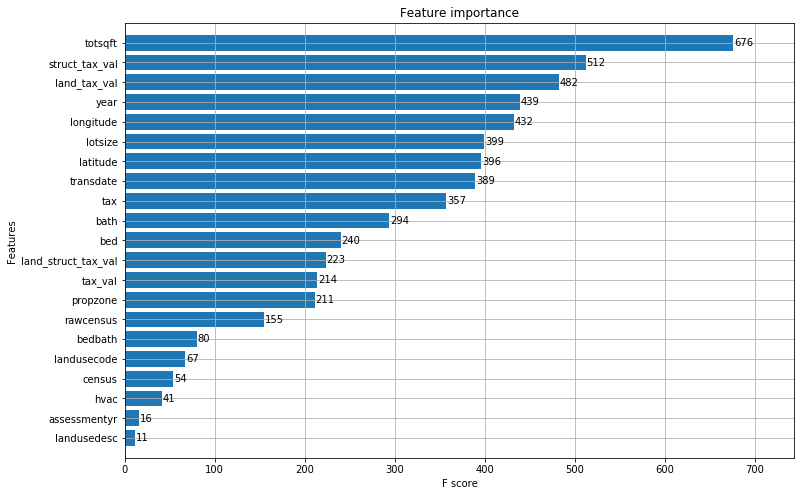

In [12]:
xgb_params = {
    'max_depth': 8,
    'seed' : 493
}
dtrain = xgb.DMatrix(xgb_df, df_features.logerror, feature_names=xgb_df.columns.values)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round=50)

# plot the important features #
fig, ax = plt.subplots(figsize=(12,8))
xgb.plot_importance(model, max_num_features=50, height=0.8, ax=ax)
plt.show()

Dropping least interesting features per the xgb chart and per my intuition.

In [13]:
df_features.drop(columns=['landusedesc', 'hvac', 'assessmentyr', 'landusecode', 'bedbath', 'rawcensus',
                          'census', 'tax_val', 'propzone', 'land_struct_tax_val', 'finsqft'], 
                 inplace=True)

In [14]:
df_features.index

Int64Index([11016594, 12098116, 12643413, 11509835, 12286022, 10854446,
            11672170, 10949761, 12524288, 10815909,
            ...
            12055795, 12892446, 12666457, 10858613, 10722691, 12412492,
            10833991, 11000655, 12773139, 12826780],
           dtype='int64', name='parcelid', length=95575)

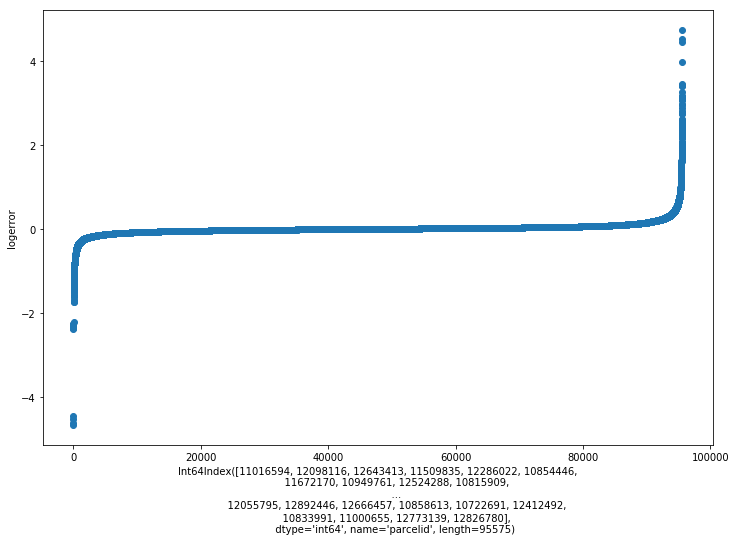

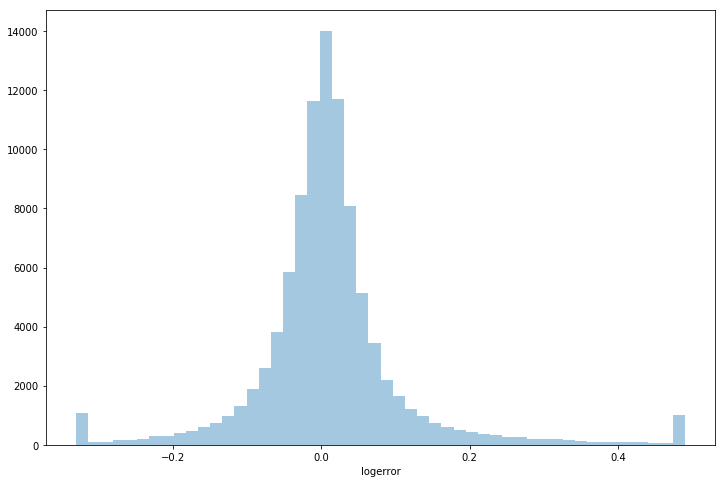

In [15]:
# Plot the log error
plt.figure(figsize=(12,8))
plt.scatter(range(df_features.shape[0]), np.sort(df_features.logerror.values))
plt.xlabel(df_features.index) # I made parcelid the index
plt.ylabel('logerror')
plt.show()

# Remove outliers
ulimit = np.percentile(df_features.logerror.values, 99)
llimit = np.percentile(df_features.logerror.values, 1)
df['logerror'].loc[df_features['logerror']>ulimit] = ulimit
df['logerror'].loc[df_features['logerror']<llimit] = llimit

# Plot the distribution
plt.figure(figsize=(12,8))
sns.distplot(df_features.logerror.values, bins=50, kde=False)
plt.xlabel('logerror')
plt.show()

May want to take absolute value of logerror at some point. 
Note that the logerror is normally distributed except for the spikes at both ends.

In [16]:
df_features.columns

Index(['logerror', 'bath', 'bed', 'totsqft', 'year', 'land_tax_val',
       'struct_tax_val', 'tax', 'zip', 'regionidcity', 'regionidcounty',
       'fips', 'latitude', 'longitude', 'lotsize', 'bldgqualtype',
       'transdate'],
      dtype='object')

In [17]:
num_cols = df_features.select_dtypes(include='number').columns.tolist()
cat_cols = df_features.select_dtypes(exclude='number').columns.tolist()

Plot all of the features to see what their distribution looks like.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1c2bcfacf8>,
      dtype=object)

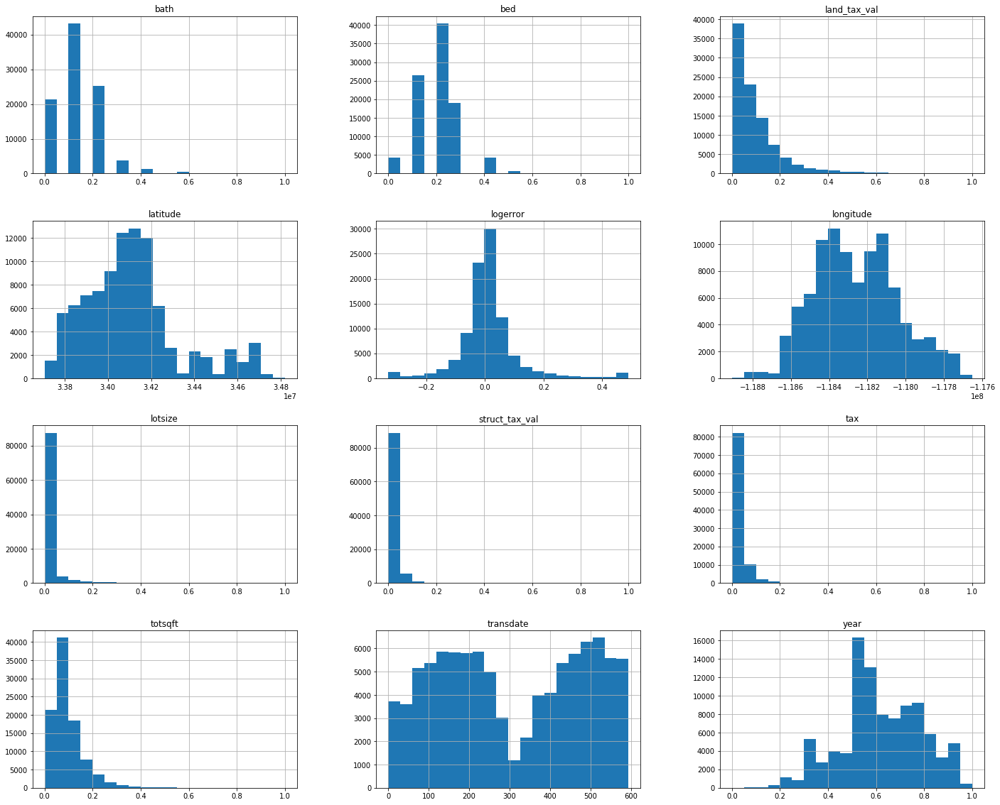

In [18]:
df_features.hist(figsize=(24, 20), bins=20)

Check pairplot to see what appears to be correlated.

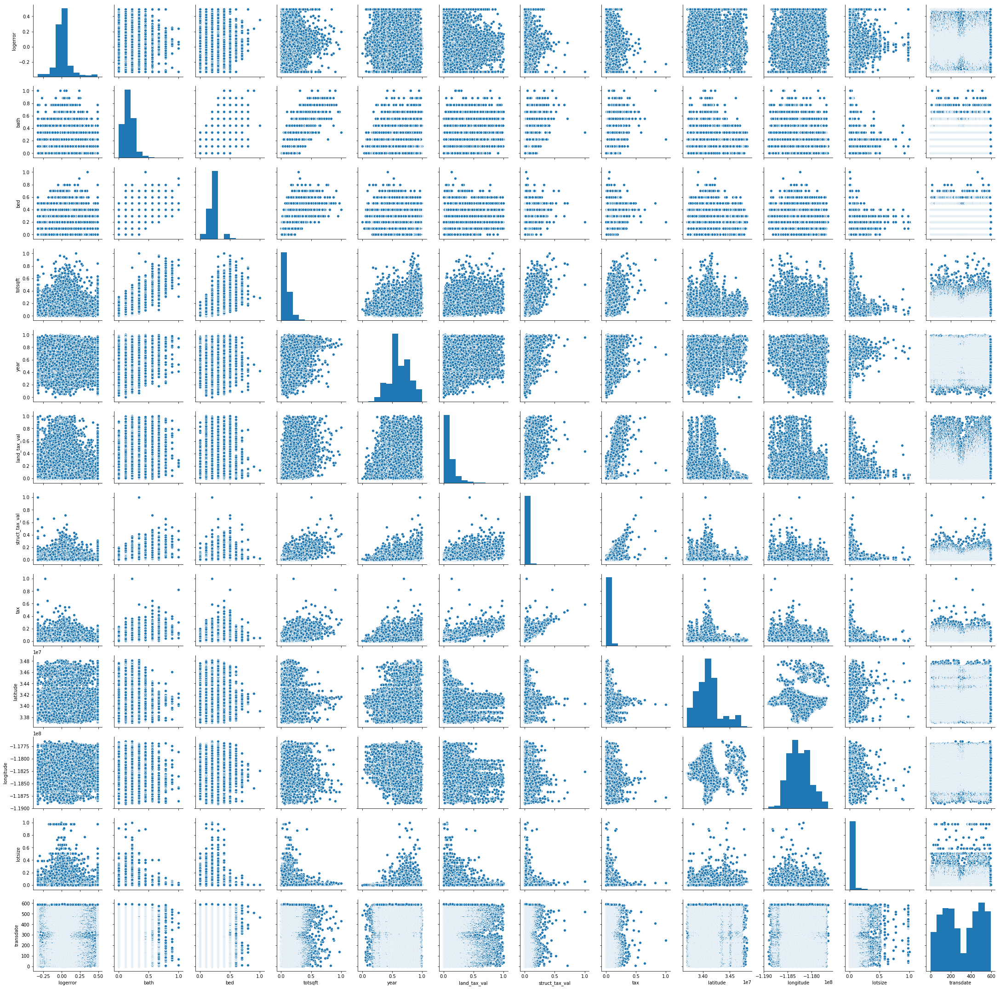

In [19]:
sns.pairplot(df_features, vars=num_cols)

Check the features correlation with a heatmap.

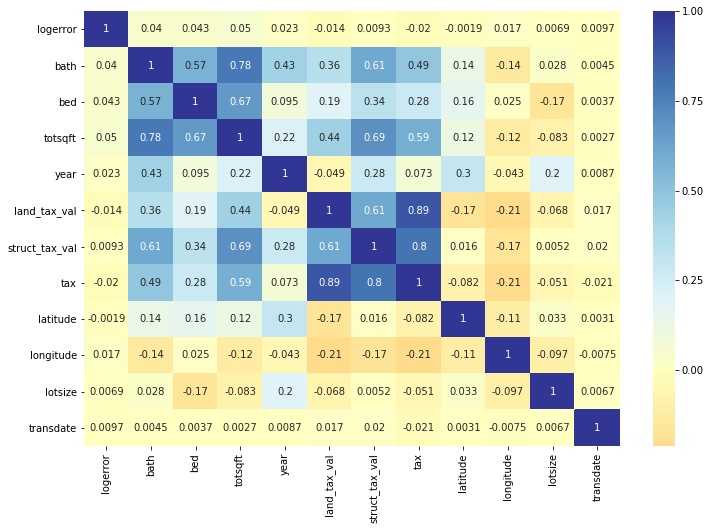

In [20]:
plt.figure(figsize=(12,8))
sns.heatmap(df_features.corr(), cmap='RdYlBu', annot=True, center=0)

Nothing really interesting is showing up here, so I probably need to cluster features.

Let's look at the summary of my data now.

In [21]:
df_summary(df_features)

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
--- Top and Bottom:
Sorted by logerror:
Head:
parcelid             13094838             12037713             12188723
logerror                -0.33                -0.33                -0.33
 
Tail: 
parcelid             12252349             12771165             10918535
logerror                 0.49                 0.49                 0.49
-----
Sorted by bath:
Head:
parcelid             12434891             12289936             12988674
bath                     0.00                 0.00                 0.00
 
Tail: 
parcelid             11688857             13080289             10933420
bath                     1.00                 1.00                 1.00
-----
Sorted by bed:
Head:
parcelid             11643551             11239094             12333087
bed                      0.00                 0.00                 0.00
 
Tail: 
parcelid             10924177             11095530             12267812
bed                      0.80 

                num_missing   missing_percentage  num_empty  \
logerror                  0                 0.00          0   
bath                      0                 0.00          0   
bed                       0                 0.00          0   
totsqft                   0                 0.00          0   
year                      0                 0.00          0   
land_tax_val              0                 0.00          0   
struct_tax_val            0                 0.00          0   
tax                       0                 0.00          0   
zip                       0                 0.00          0   
regionidcity              0                 0.00          0   
regionidcounty            0                 0.00          0   
fips                      0                 0.00          0   
latitude                  0                 0.00          0   
longitude                 0                 0.00          0   
lotsize                   0                 0.00       

In [22]:
columns = df_features.select_dtypes('object').columns
columns = columns.append(df_features.select_dtypes('category').columns)
for col in columns:
    print(col, df_features[col].value_counts(dropna=False))


zip 97,319.00    1687
97,318.00    1385
97,329.00    1284
97,328.00    1229
96,193.00    1037
96,368.00     913
96,505.00     906
96,389.00     868
96,364.00     851
96,378.00     823
96,370.00     778
96,122.00     777
97,330.00     751
96,401.00     740
97,317.00     729
96,030.00     721
96,190.00     709
96,242.00     708
96,247.00     672
96,236.00     666
96,379.00     660
96,349.00     652
96,369.00     638
96,050.00     637
96,124.00     633
96,489.00     628
96,449.00     622
96,361.00     619
96,117.00     608
96,023.00     591
             ... 
96,126.00      82
96,004.00      77
96,216.00      76
96,322.00      75
96,019.00      75
96,135.00      60
96,014.00      54
97,316.00      54
96,136.00      52
96,010.00      51
96,038.00      47
96,434.00      47
96,021.00      45
95,998.00      44
96,009.00      43
95,994.00      43
96,323.00      42
97,331.00      31
96,119.00      31
97,324.00      29
95,988.00      28
96,385.00      27
96,148.00      14
95,995.00      10
96,002

# Clustering
### Cluster 1 -- logerror only

   k                  sse
0  1             1,033.10
1  2               545.77
2  3               297.83
3  4               183.24
4  5               116.11
5  6                80.10
6  7                57.82
7  8                43.45
8  9                33.97


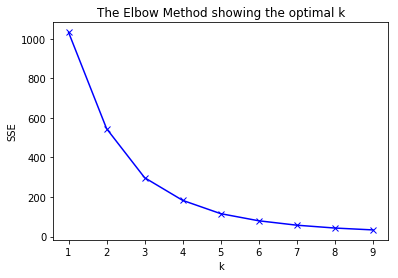

In [23]:
title= 'The Elbow Method showing the optimal k'
ks = range(1,10)
sse = []
for k in ks:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_features[['logerror']])

    # inertia: Sum of squared distances of samples to their 
    # closest cluster center.
    sse.append(kmeans.inertia_)

print(pd.DataFrame(dict(k=ks, sse=sse)))

plt.plot(ks, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title(title)
plt.show()

Maybe somewhere between 3 and 6 is best...

In [24]:
estimators = [('3 Clusters', KMeans(n_clusters=3)),
              ('4 Clusters', KMeans(n_clusters=4)),
              ('5 Clusters', KMeans(n_clusters=5)),
              ('6 Clusters', KMeans(n_clusters=6))]

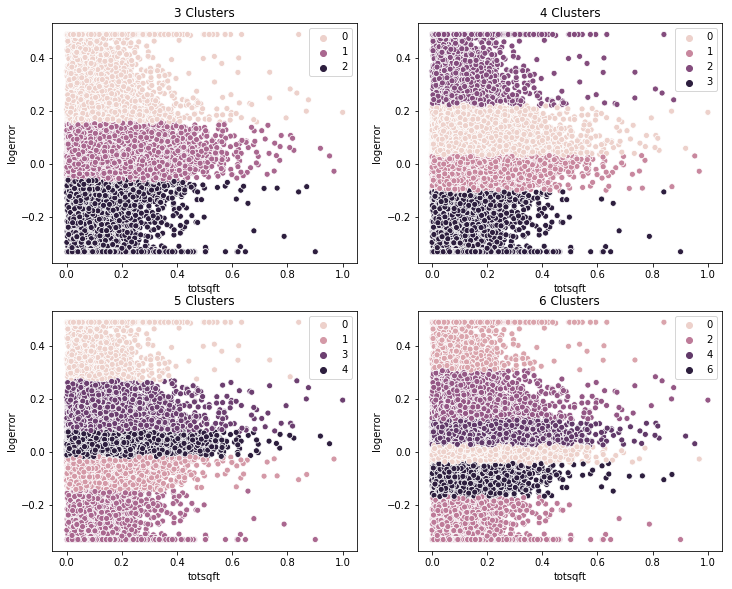

In [25]:
plt.subplots(nrows=2,ncols=2, figsize=(12,15))
for i, (title, kmeans) in enumerate(estimators):
    kmeans.fit(df_features[['logerror']])
    labels = kmeans.labels_
    plot_number = i + 1 # i starts at 0, but plot nos should start at 1
    plt.subplot(3, 2, plot_number) # numrows, numcols, plot_number
    plt.title(title)
    sns.scatterplot(df_features.totsqft, df_features.logerror, hue=labels)

Graph in 3-D

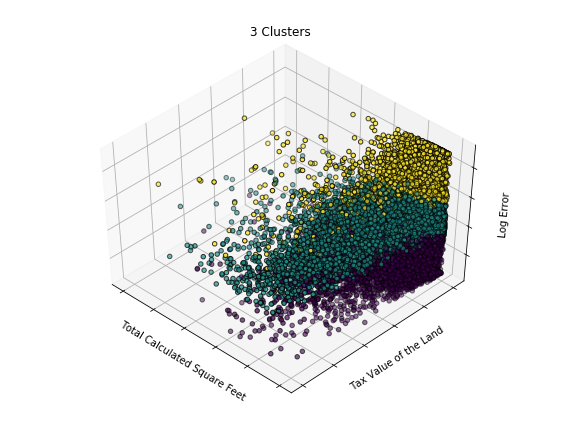

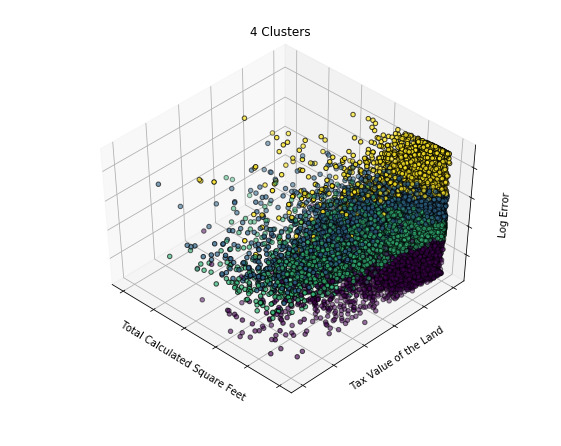

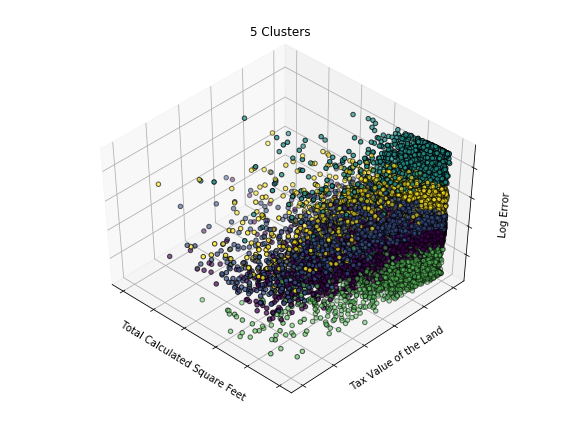

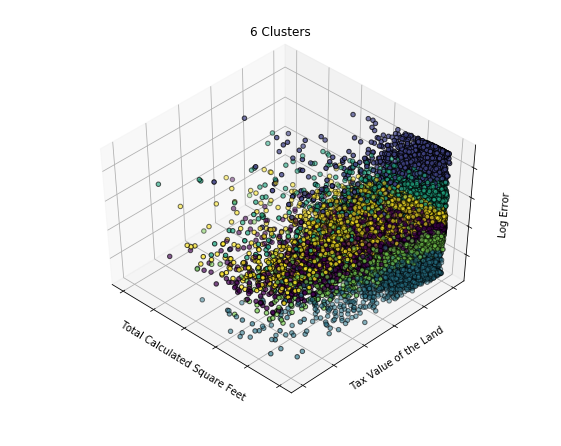

In [26]:
for i, (title, kmeans) in enumerate(estimators):
    # fit the kmeans object
    kmeans.fit(df_features[['logerror']])

    fig = plt.figure(i + 1, figsize=(8, 6))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    labels = kmeans.labels_

    ax.scatter(df_features.totsqft,
               df_features.land_tax_val,
               df_features.logerror, 
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Total Calculated Square Feet')
    ax.set_ylabel('Tax Value of the Land')
    ax.set_zlabel('Log Error')
    ax.set_title(title)
    ax.dist = 12

4 clusters definitely looks the cleanest. 
So set cluster_target_A to 4 clusters and fit only on logerror.

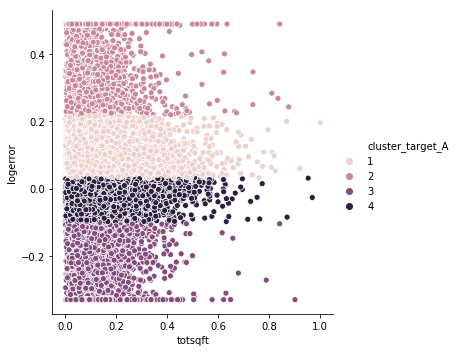

In [27]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df_features[['logerror']])
df_features['cluster_target_A'] = kmeans.predict(df_features[['logerror']])
df_features.cluster_target_A = (df_features.cluster_target_A + 1)
sns.relplot(data=df_features, x='totsqft', y='logerror', hue='cluster_target_A')

In [28]:
df_features.cluster_target_A.value_counts()

4    60683
1    24467
3     6877
2     3548
Name: cluster_target_A, dtype: int64

In [29]:
kmeans.cluster_centers_

array([[ 0.07769431],
       [ 0.36067674],
       [-0.18629003],
       [-0.01340067]])

In [30]:
df_features[['logerror', 'totsqft', 'land_tax_val', 'struct_tax_val', 'year', 'cluster_target_A']].sample(10)

,logerror,totsqft,land_tax_val,struct_tax_val,year,cluster_target_A
parcelid,,,,,,
12017332,0.01,0.10,0.02,0.01,0.38,4
11545632,0.12,0.07,0.02,0.00,0.37,1
11191627,-0.04,0.21,0.03,0.03,0.91,4
10820059,0.02,0.05,0.10,0.01,0.52,4
10922211,0.03,0.07,0.07,0.04,0.46,4
12519167,-0.02,0.06,0.14,0.02,0.53,4
11170473,-0.33,0.05,0.04,0.02,0.80,3
12807229,-0.12,0.06,0.09,0.01,0.55,3
12057121,0.02,0.14,0.38,0.01,0.51,4


### Cluster 2 -- totsqft

   k                  sse
0  1               439.72
1  2               177.26
2  3                99.95
3  4                63.31
4  5                42.73
5  6                31.27
6  7                23.61
7  8                18.55
8  9                14.66


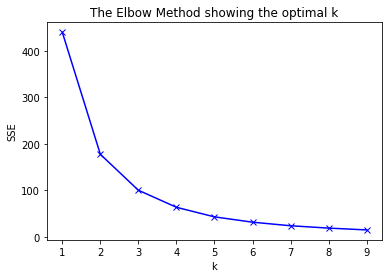

In [31]:
title= 'The Elbow Method showing the optimal k'
ks = range(1,10)
sse = []
for k in ks:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_features[['totsqft']])

    # inertia: Sum of squared distances of samples to their 
    # closest cluster center.
    sse.append(kmeans.inertia_)

print(pd.DataFrame(dict(k=ks, sse=sse)))

plt.plot(ks, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title(title)
plt.show()

4 clusters again looks best.

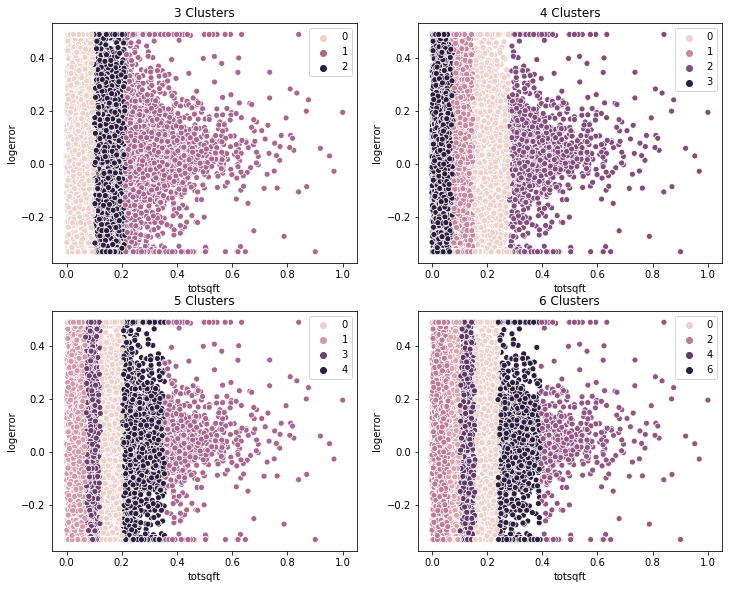

In [32]:
plt.subplots(nrows=2,ncols=2, figsize=(12,15))
for i, (title, kmeans) in enumerate(estimators):
    kmeans.fit(df_features[['totsqft']])
    labels = kmeans.labels_
    plot_number = i + 1 # i starts at 0, but plot nos should start at 1
    plt.subplot(3, 2, plot_number) # numrows, numcols, plot_number
    plt.title(title)
    sns.scatterplot(df_features.totsqft, df_features.logerror, hue=labels)

I like four clusters still.

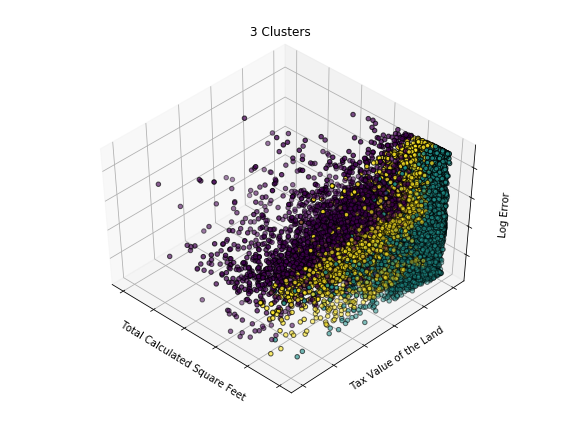

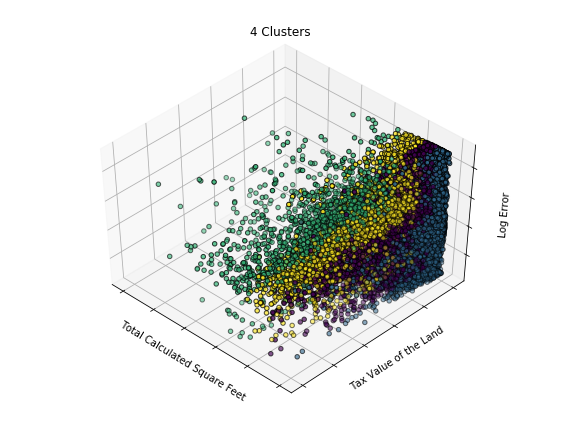

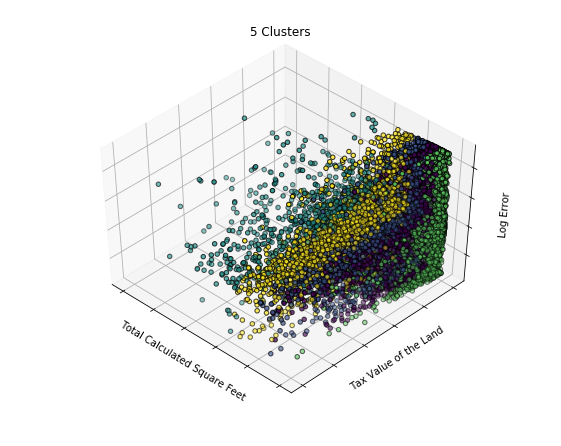

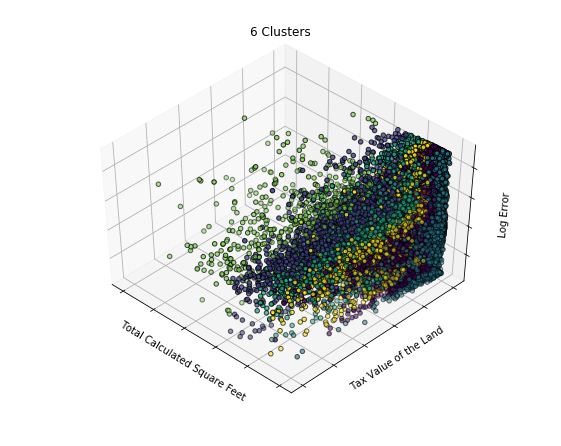

In [33]:
for i, (title, kmeans) in enumerate(estimators):
    # fit the kmeans object
    kmeans.fit(df_features[['totsqft']])

    fig = plt.figure(i + 1, figsize=(8, 6))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    labels = kmeans.labels_

    ax.scatter(df_features.totsqft,
               df_features.land_tax_val,
               df_features.logerror, 
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Total Calculated Square Feet')
    ax.set_ylabel('Tax Value of the Land')
    ax.set_zlabel('Log Error')
    ax.set_title(title)
    ax.dist = 12

With the kmeans fit to totsqft, four clusters is very noisy, but it is still the best fit.

Create the cluster target for totsqft...

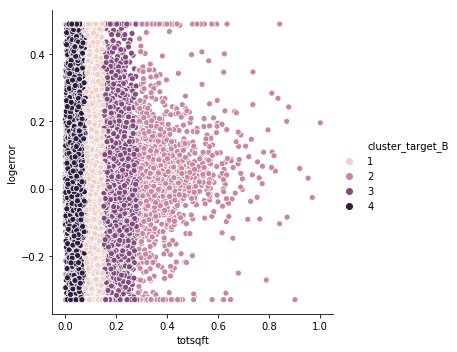

In [34]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df_features[['totsqft']])
df_features['cluster_target_B'] = kmeans.predict(df_features[['totsqft']])
df_features.cluster_target_B = (df_features.cluster_target_B + 1)
sns.relplot(data=df_features, x='totsqft', y='logerror', hue='cluster_target_B')

In [35]:
df_features.cluster_target_B.value_counts()

4    46949
1    34022
3    12499
2     2105
Name: cluster_target_B, dtype: int64

In [36]:
kmeans.cluster_centers_

array([[0.10608822],
       [0.36619289],
       [0.1940184 ],
       [0.05007796]])

In [37]:
df_features[['logerror', 'totsqft', 'land_tax_val', 'struct_tax_val', 'year','cluster_target_A', 'cluster_target_B']].sample(10)

,logerror,totsqft,land_tax_val,struct_tax_val,year,cluster_target_A,cluster_target_B
parcelid,,,,,,,
12485775,-0.01,0.09,0.16,0.02,0.55,4,1
10937013,-0.07,0.06,0.16,0.01,0.44,4,4
10814338,0.16,0.28,0.02,0.03,0.63,1,2
12704777,0.16,0.10,0.03,0.03,0.62,1,1
11696187,-0.09,0.09,0.08,0.02,0.25,4,1
12660273,0.05,0.14,0.27,0.07,0.93,1,1
11955066,-0.07,0.05,0.11,0.02,0.36,4,4
11690976,0.05,0.18,0.07,0.07,0.74,1,3
11578508,0.05,0.11,0.21,0.03,0.82,1,1


### Cluster 3 -- land_tax_val

   k                  sse
0  1             1,310.94
1  2               510.34
2  3               247.23
3  4               143.15
4  5                92.34
5  6                64.71
6  7                46.92
7  8                35.79
8  9                28.21


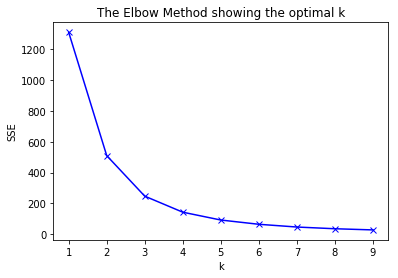

In [38]:
title= 'The Elbow Method showing the optimal k'
ks = range(1,10)
sse = []
for k in ks:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_features[['land_tax_val']])

    # inertia: Sum of squared distances of samples to their 
    # closest cluster center.
    sse.append(kmeans.inertia_)

print(pd.DataFrame(dict(k=ks, sse=sse)))

plt.plot(ks, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title(title)
plt.show()

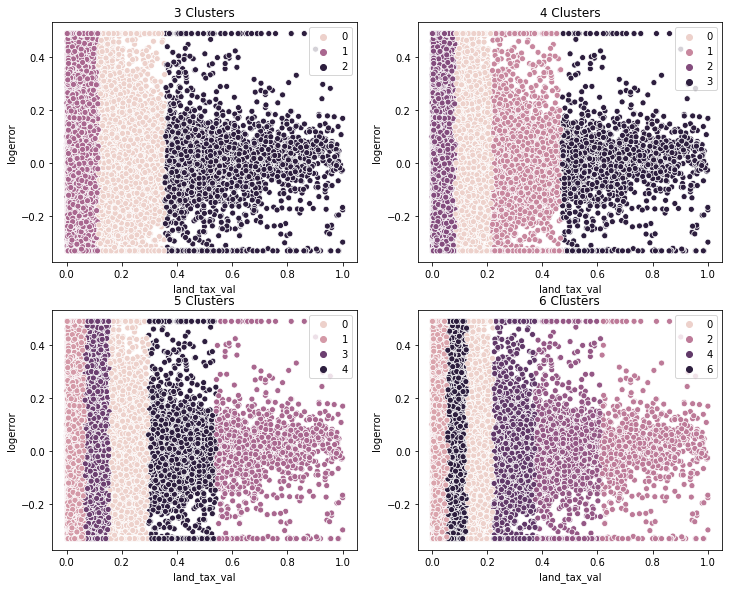

In [39]:
plt.subplots(nrows=2,ncols=2, figsize=(12,15))
for i, (title, kmeans) in enumerate(estimators):
    kmeans.fit(df_features[['land_tax_val']])
    labels = kmeans.labels_
    plot_number = i + 1 # i starts at 0, but plot nos should start at 1
    plt.subplot(3, 2, plot_number) # numrows, numcols, plot_number
    plt.title(title)
    sns.scatterplot(df_features.land_tax_val, df_features.logerror, hue=labels)

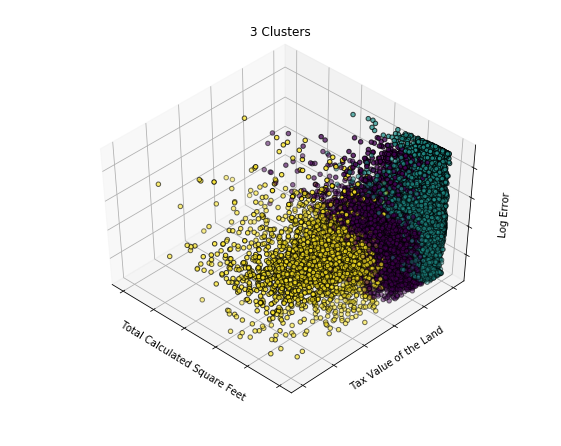

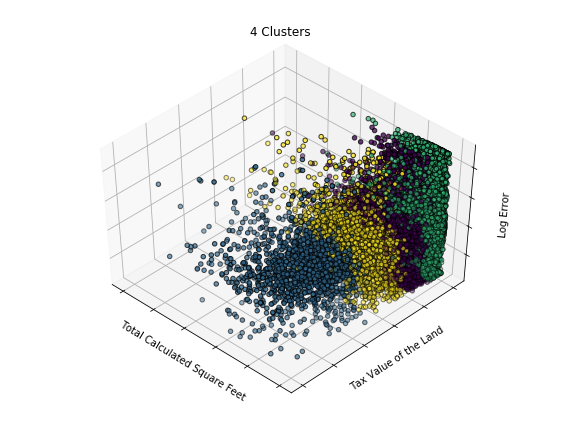

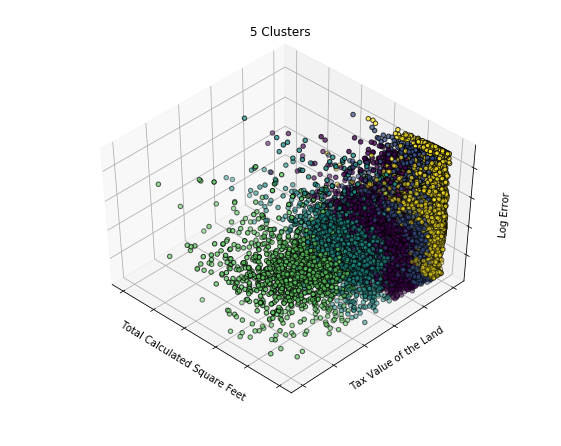

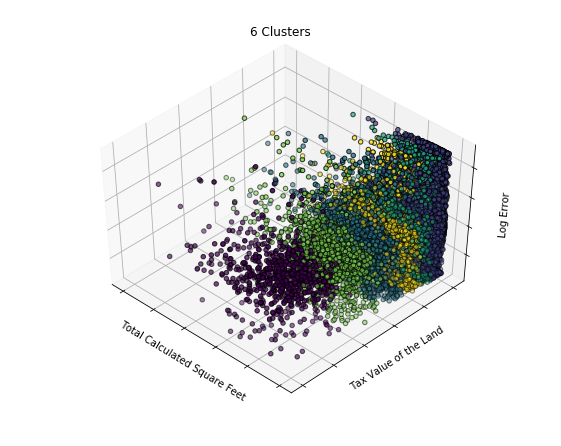

In [40]:
for i, (title, kmeans) in enumerate(estimators):
    # fit the kmeans object
    kmeans.fit(df_features[['land_tax_val']])

    fig = plt.figure(i + 1, figsize=(8, 6))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    labels = kmeans.labels_

    ax.scatter(df_features.totsqft,
               df_features.land_tax_val,
               df_features.logerror, 
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Total Calculated Square Feet')
    ax.set_ylabel('Tax Value of the Land')
    ax.set_zlabel('Log Error')
    ax.set_title(title)
    ax.dist = 12

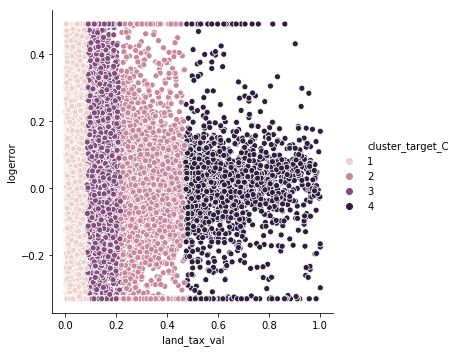

In [41]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df_features[['land_tax_val']])
df_features['cluster_target_C'] = kmeans.predict(df_features[['land_tax_val']])
df_features.cluster_target_C = (df_features.cluster_target_C + 1)
sns.relplot(data=df_features, x='land_tax_val', y='logerror', hue='cluster_target_C')

In [42]:
df_features.cluster_target_C.value_counts()

1    55605
3    29983
2     7955
4     2032
Name: cluster_target_C, dtype: int64

In [43]:
kmeans.cluster_centers_

array([[0.03554884],
       [0.30075436],
       [0.13318557],
       [0.63608246]])

In [44]:
df_features[['logerror', 'totsqft', 'land_tax_val', 'struct_tax_val', 'year', 'cluster_target_A', 'cluster_target_B', 'cluster_target_C']].sample(10)

,logerror,totsqft,land_tax_val,struct_tax_val,year,cluster_target_A,cluster_target_B,cluster_target_C
parcelid,,,,,,,,
12473090,0.03,0.06,0.13,0.01,0.54,4,4,3
12338633,0.09,0.06,0.06,0.01,0.62,1,4,1
11063921,0.02,0.11,0.10,0.03,0.59,4,1,3
13062301,0.04,0.11,0.06,0.02,0.80,1,1,1
11940481,0.03,0.06,0.01,0.00,0.54,1,4,1
12796598,0.05,0.09,0.06,0.01,0.51,1,1,1
12497803,0.14,0.03,0.13,0.01,0.36,1,4,3
12935510,-0.03,0.11,0.13,0.01,0.56,4,1,3
12672093,0.01,0.10,0.27,0.02,0.56,4,1,2


See what happens if I fit the model with logerror AND totsqft...

### logerror AND totsqft -- decided not to use

   k                  sse
0  1             1,472.82
1  2               984.70
2  3               736.92
3  4               514.38
4  5               414.19
5  6               349.76
6  7               290.32
7  8               259.53
8  9               232.25


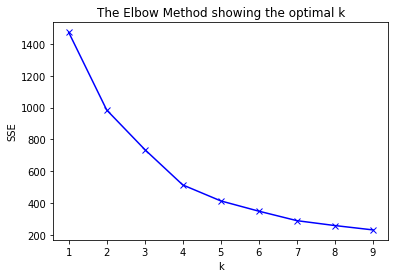

In [45]:
title= 'The Elbow Method showing the optimal k'
ks = range(1,10)
sse = []
for k in ks:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_features[['logerror', 'totsqft']])

    # inertia: Sum of squared distances of samples to their 
    # closest cluster center.
    sse.append(kmeans.inertia_)

print(pd.DataFrame(dict(k=ks, sse=sse)))

plt.plot(ks, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title(title)
plt.show()

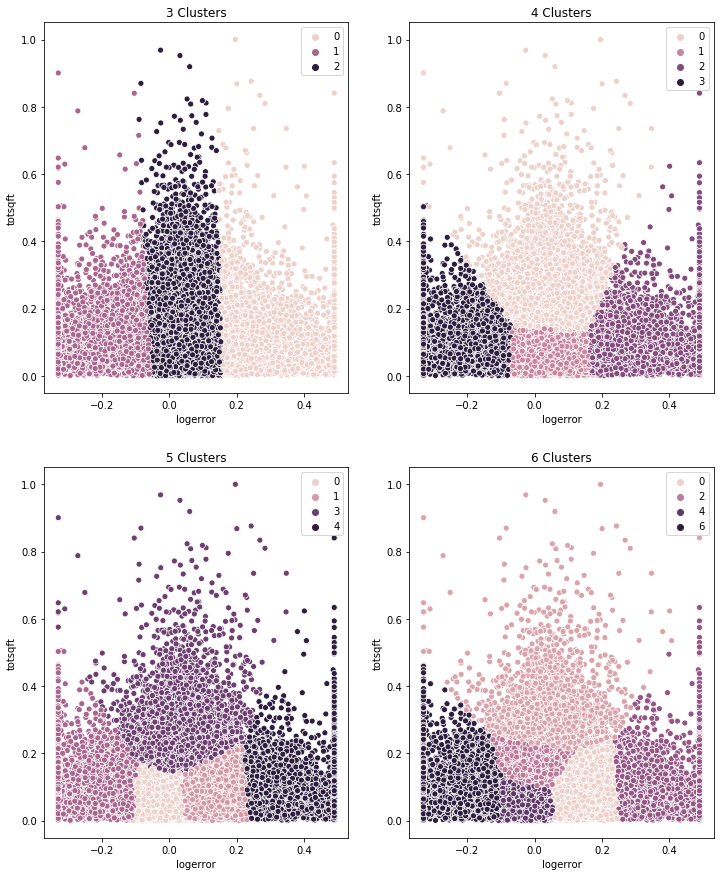

In [46]:
plt.subplots(nrows=2,ncols=2, figsize=(12,15))
for i, (title, kmeans) in enumerate(estimators):
    kmeans.fit(df_features[['logerror', 'totsqft']])
    labels = kmeans.labels_
    plot_number = i + 1 # i starts at 0, but plot nos should start at 1
    plt.subplot(2, 2, plot_number) # numrows, numcols, plot_number
    plt.title(title)
    sns.scatterplot(df_features.logerror, df_features.totsqft, hue=labels)

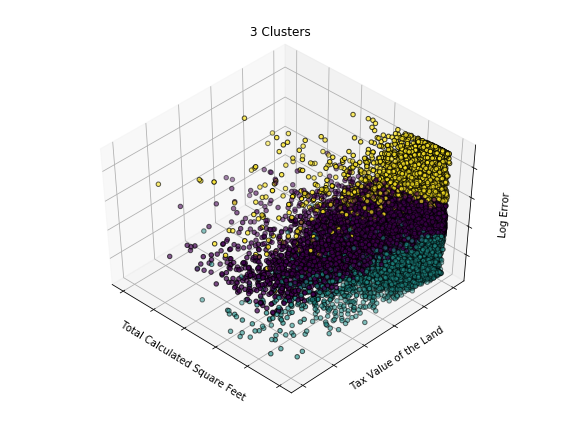

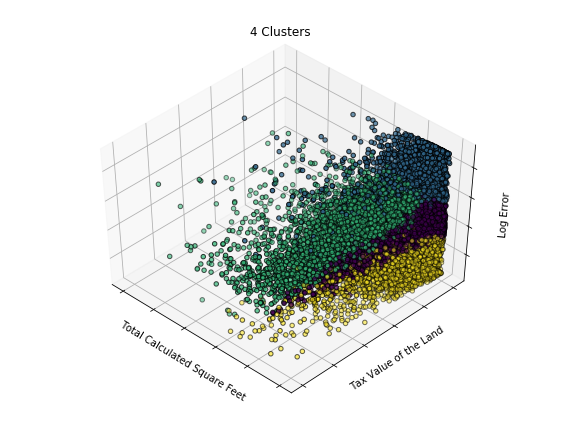

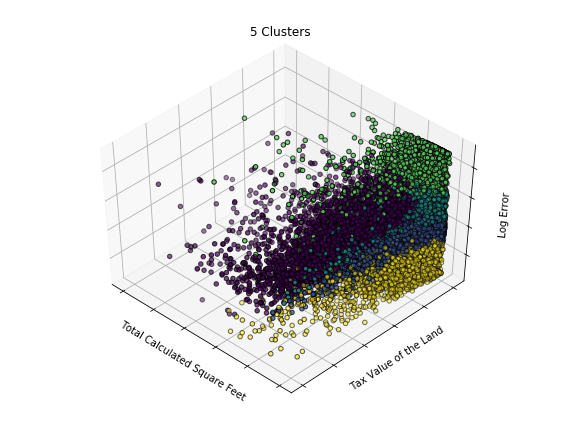

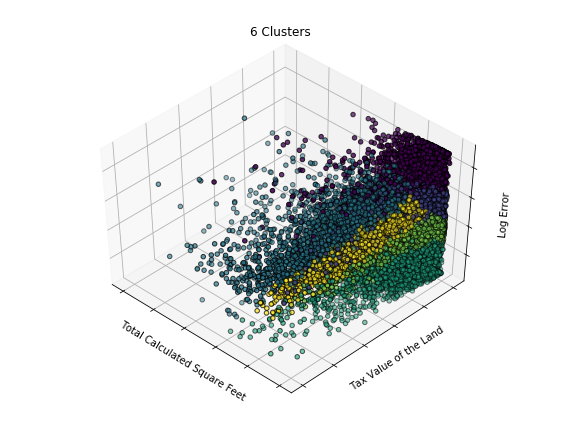

In [47]:
for i, (title, kmeans) in enumerate(estimators):
    # fit the kmeans object
    kmeans.fit(df_features[['logerror', 'totsqft']])

    fig = plt.figure(i + 1, figsize=(8, 6))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    labels = kmeans.labels_

    ax.scatter(df_features.totsqft,
               df_features.land_tax_val,
               df_features.logerror, 
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Total Calculated Square Feet')
    ax.set_ylabel('Tax Value of the Land')
    ax.set_zlabel('Log Error')
    ax.set_title(title)
    ax.dist = 12

Fitting the model to two features makes the clusters too noisy, so I'm not going to create the fourth model.

But I'm going to try fitting longitude and latitude to a model to see what happens.

### Cluster 4 -- latitude, longitude, and totsqft

   k                      sse
0  1 9,238,528,137,069,368.00
1  2 5,410,070,443,788,378.00
2  3 3,403,402,437,642,648.50
3  4 2,139,818,935,327,929.00
4  5 1,582,188,401,662,165.00
5  6 1,286,234,847,238,585.75
6  7 1,052,838,263,919,904.50
7  8   881,209,566,544,927.25
8  9   761,145,363,648,880.25


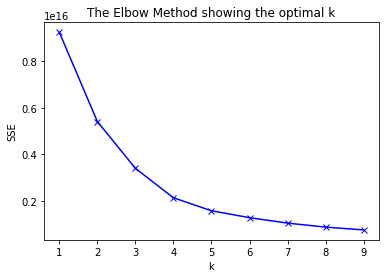

In [48]:
title= 'The Elbow Method showing the optimal k'
ks = range(1,10)
sse = []
for k in ks:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_features[['latitude', 'longitude', 'totsqft']])

    # inertia: Sum of squared distances of samples to their 
    # closest cluster center.
    sse.append(kmeans.inertia_)

print(pd.DataFrame(dict(k=ks, sse=sse)))

plt.plot(ks, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title(title)
plt.show()

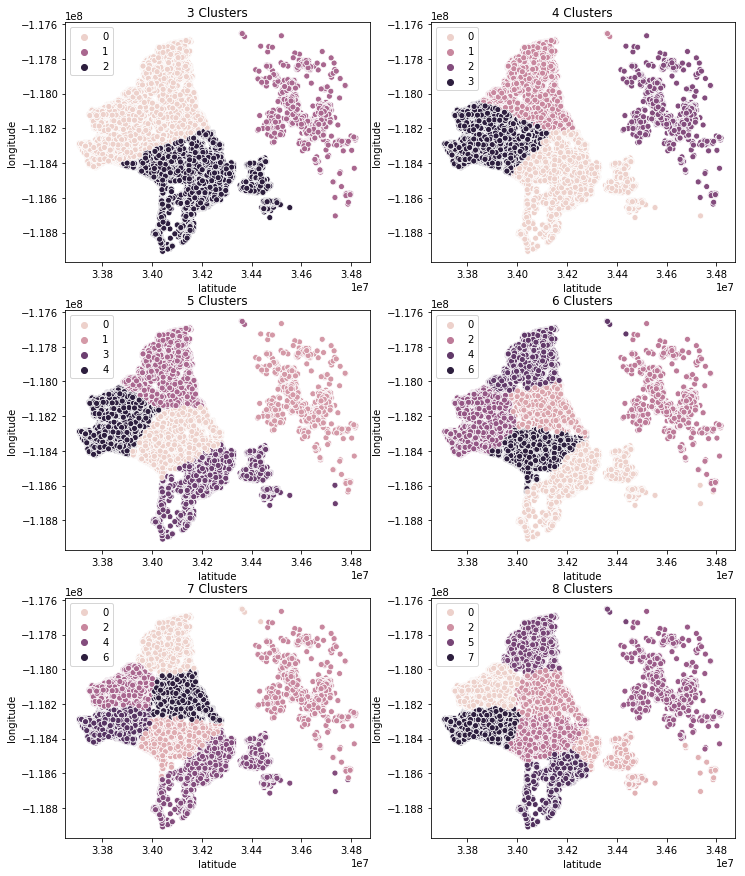

In [49]:
estimators = [('3 Clusters', KMeans(n_clusters=3)),
              ('4 Clusters', KMeans(n_clusters=4)),
              ('5 Clusters', KMeans(n_clusters=5)),
              ('6 Clusters', KMeans(n_clusters=6)),
              ('7 Clusters', KMeans(n_clusters=7)),
              ('8 Clusters', KMeans(n_clusters=8)),
             ]

plt.subplots(nrows=3,ncols=2, figsize=(12,15))
for i, (title, kmeans) in enumerate(estimators):
    kmeans.fit(df_features[['latitude', 'longitude', 'totsqft']])
    labels = kmeans.labels_
    plot_number = i + 1 # i starts at 0, but plot nos should start at 1
    plt.subplot(3, 2, plot_number) # numrows, numcols, plot_number
    plt.title(title)
    sns.scatterplot(df_features.latitude, df_features.longitude, hue=labels)

A map! I think I'll use that as a model and use 5 clusters. But let's check the 3-D model.

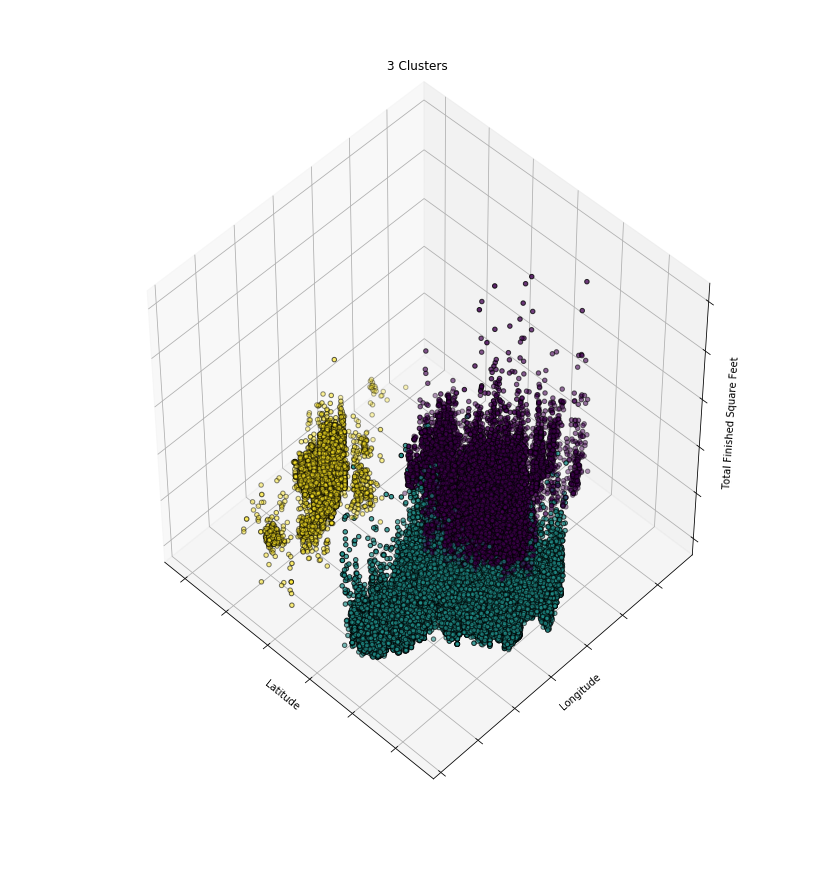

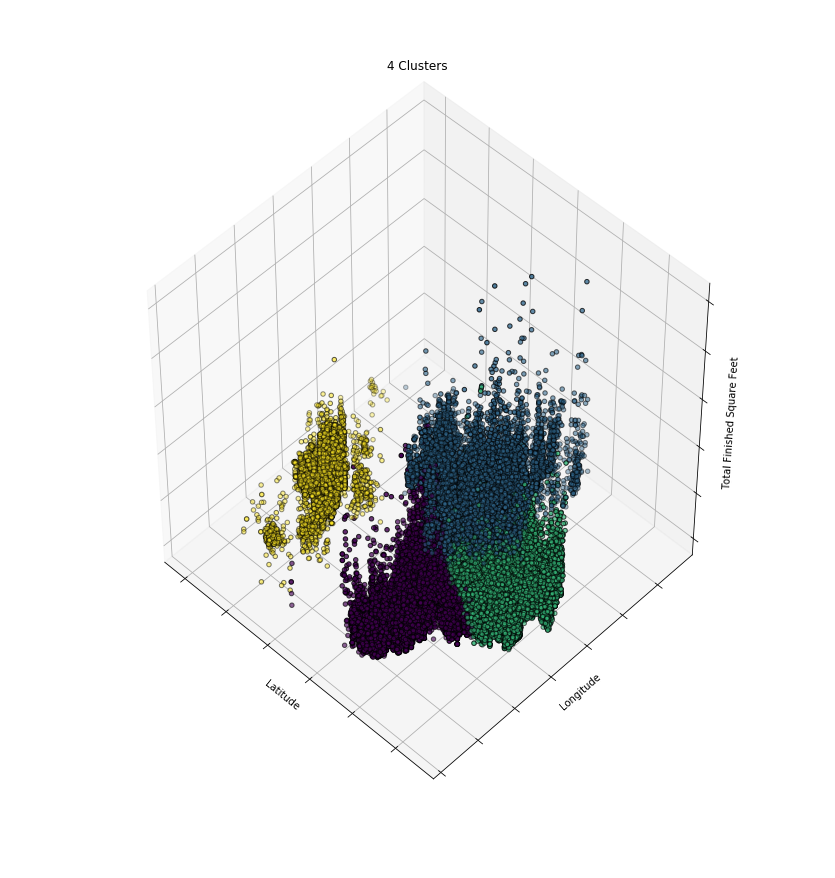

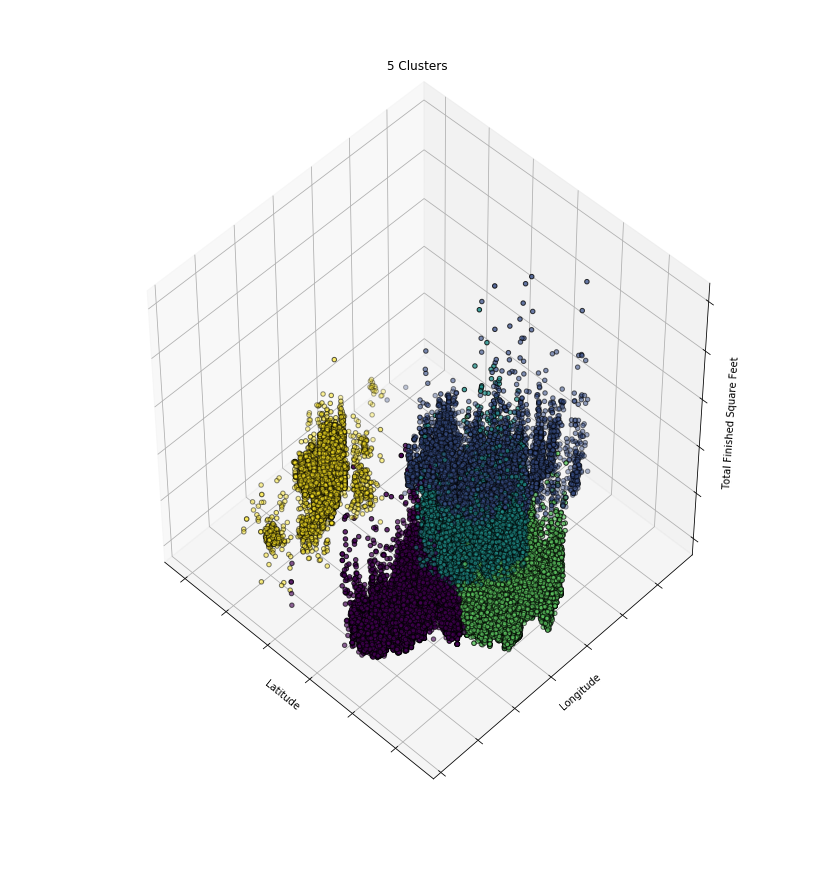

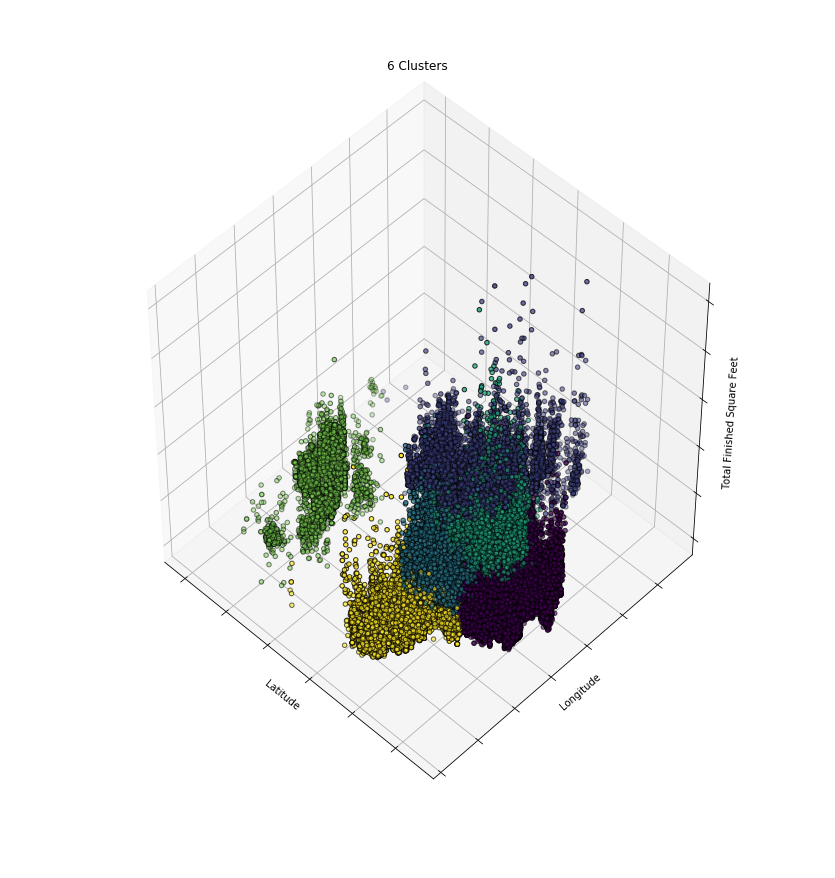

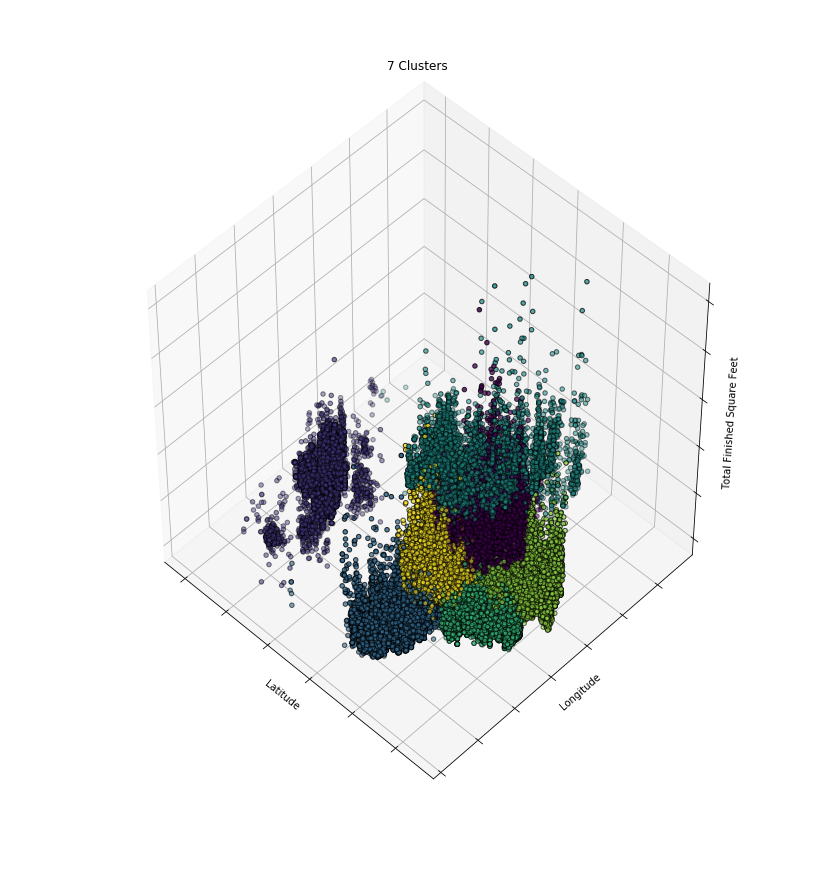

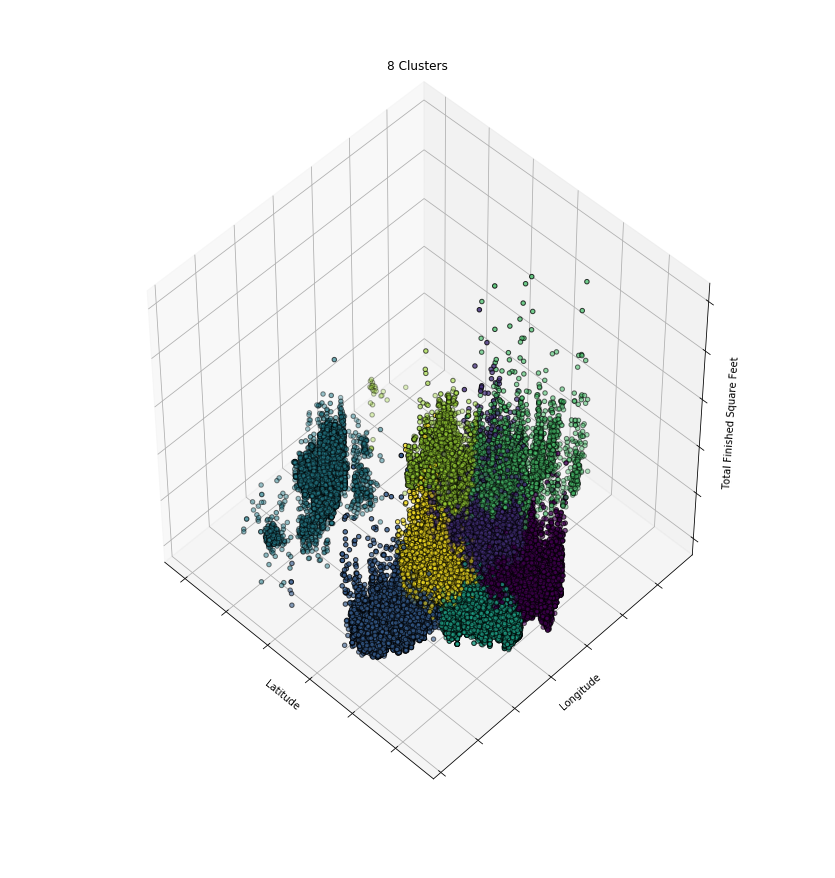

In [50]:
for i, (title, kmeans) in enumerate(estimators):
    # fit the kmeans object
    kmeans.fit(df_features[['latitude', 'longitude', 'totsqft']])

    fig = plt.figure(i + 1, figsize=(12, 12))
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
    labels = kmeans.labels_

    ax.scatter(df_features.latitude,
               df_features.longitude,
               df_features.totsqft,
               c=labels.astype(np.float), edgecolor='k')

    ax.w_xaxis.set_ticklabels([])
    ax.w_yaxis.set_ticklabels([])
    ax.w_zaxis.set_ticklabels([])
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Longitude')
    ax.set_zlabel('Total Finished Square Feet')
    ax.set_title(title)
    ax.dist = 12


The 3-D model convinced me to go back to 4 clusters.

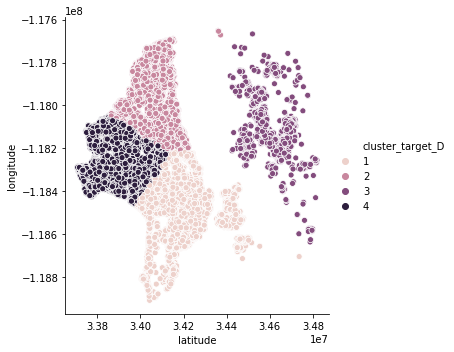

In [51]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df_features[['latitude', 'longitude', 'totsqft']])
df_features['cluster_target_D'] = kmeans.predict(df_features[['latitude', 'longitude', 'totsqft']])
df_features.cluster_target_D = (df_features.cluster_target_D + 1)
sns.relplot(data=df_features, x='latitude', y='longitude', hue='cluster_target_D')

In [52]:
df_features.cluster_target_D.value_counts()

1    34719
4    29691
2    23483
3     7682
Name: cluster_target_D, dtype: int64

In [53]:
kmeans.cluster_centers_ 

array([[ 3.41958063e+07, -1.18466946e+08,  1.08017287e-01],
       [ 3.40662624e+07, -1.17985474e+08,  9.27115259e-02],
       [ 3.46274239e+07, -1.18123528e+08,  1.11658547e-01],
       [ 3.38971231e+07, -1.18260425e+08,  7.99371071e-02]])

In [54]:
df_features[['logerror', 'totsqft', 'land_tax_val', 'struct_tax_val', 'year', 'cluster_target_A', 'cluster_target_B', 'cluster_target_C', 'cluster_target_D']].sample(10)

,logerror,totsqft,land_tax_val,struct_tax_val,year,cluster_target_A,cluster_target_B,cluster_target_C,cluster_target_D
parcelid,,,,,,,,,
12640690,0.04,0.13,0.15,0.01,0.61,1,1,3,4
11637336,-0.11,0.19,0.69,0.12,0.81,3,3,4,1
10833602,-0.00,0.10,0.16,0.01,0.57,4,1,3,1
12136026,-0.03,0.16,0.14,0.07,0.88,4,3,3,2
11824350,-0.07,0.06,0.01,0.01,0.73,4,4,1,4
11570439,-0.01,0.11,0.23,0.05,0.88,4,1,2,1
11081352,0.02,0.17,0.12,0.04,0.64,4,3,3,1
10837181,-0.06,0.05,0.13,0.02,0.52,4,4,3,1
12439564,0.02,0.07,0.18,0.03,0.55,4,4,3,4


# Test the Significance of Clusters

### Pearson’s Correlation Coefficient
1. Tests whether two samples have a linear relationship.
    - The correlation coefficient is a numerical measure of the sign and strength of the linear association between two variables.
    - It is like covariance, but divides out the standard deviations of both variables.
    - It is unitless and always lies between -1 and 1, where 1 = perfect correlation and -1 = perfect negative correlation.
    - The correlation coefficient will range between -1.00 (negative correlation) and +1.00 (positive correlation).
    - Correlation is not causality. A causal relationship exists when the independent variable is the underlying contributing determinant of the dependent variable. A causal relationship may be suggested by correlation; it is not proof a causal relationship exists however.
2. Assumptions
    - Observations in each sample are independent and identically distributed (iid).
    - Observations in each sample are normally distributed.
    - Observations in each sample have the same variance.
3. Interpretation
    - H0: the two samples are independent.
    - H1: there is a dependency between the samples.
4. SUMMARY:
    - compares two continuous variables
    - our test statistic, r, gives us the strength and direction of the linear correlation between the two variables.
    - H0: there is no linear correlation between the two variables.

In [55]:
X = df_features.copy()
cluster_vars = ['cluster_target_A', 'cluster_target_B', 'cluster_target_C', 'cluster_target_D']
cluster_df = X[cluster_vars]
cluster_df.sample(3)

,cluster_target_A,cluster_target_B,cluster_target_C,cluster_target_D
parcelid,,,,
12215532,1,4,1,4
11516546,4,4,2,4
11499487,1,4,2,4


In [56]:
for outter_col in cluster_vars:
    r_and_p_values = {col: stats.pearsonr(cluster_df[outter_col], cluster_df[col]) for col in cluster_vars}
        
    for k, v in r_and_p_values.items():
        col = k
        r, p = v
        if (r > .001 and r < 1 and p < .05 and p > 0) | (r < -.001 and r > -1 and p < .05 and p > 0) :
            print("PEARSON'S R for ", outter_col, ':')
            print(f"\t{outter_col} and {col}:")
            print(f"\t\tPearson's R is {r:.2f} ")
            print(f"\t\twith a significance p-value of {p: .3}\n")

PEARSON'S R for  cluster_target_A :
	cluster_target_A and cluster_target_B:
		Pearson's R is 0.02 
		with a significance p-value of  1.07e-10

PEARSON'S R for  cluster_target_A :
	cluster_target_A and cluster_target_C:
		Pearson's R is -0.01 
		with a significance p-value of  0.00635

PEARSON'S R for  cluster_target_A :
	cluster_target_A and cluster_target_D:
		Pearson's R is 0.02 
		with a significance p-value of  1.78e-11

PEARSON'S R for  cluster_target_B :
	cluster_target_B and cluster_target_A:
		Pearson's R is 0.02 
		with a significance p-value of  1.07e-10

PEARSON'S R for  cluster_target_B :
	cluster_target_B and cluster_target_C:
		Pearson's R is -0.10 
		with a significance p-value of  2.96e-198

PEARSON'S R for  cluster_target_B :
	cluster_target_B and cluster_target_D:
		Pearson's R is 0.09 
		with a significance p-value of  5.34e-180

PEARSON'S R for  cluster_target_C :
	cluster_target_C and cluster_target_A:
		Pearson's R is -0.01 
		with a significance p-value of  0.006

There are no linear relationships directly between any two ungrouped variables.

### T-Test

1. compares means for some continuous variable for 2 groups (or 1 group vs a population mean)
2. assumes the continuous variable is normally distributed, equal variance in both groups.
3. H0: the means are the same for each group.

A t-score of #.# means the groups are #.# times as different from each other as they are within each other.
    - The larger the t statistic, the more difference there is between the groups, the more likely it is that the results are repeatable, i.e. that the difference is significant.
    - The smaller the score, the more similarity.


Null hypothesis: the means will be the same between the cluster groups of the same cluster number.

Result: There were many clusters were there was and alpha was less than .05, so I reject the null hypothesis.

I.e. the cluster groups do not predict the same cluster numbers.

In [57]:
print('t-test statistics for:')
for outter_col in cluster_vars:
    for inner_col in cluster_vars:
        for i in range(1,5):
            t, p = stats.ttest_ind(df_features[df_features[outter_col] == i]['logerror'], df_features[df_features[inner_col] == i]['logerror'])
            if p < .05 and p > 0:
                if t > 7 or t < -7:
                    print(f"\t{outter_col} and {inner_col} = {i}:")
                    print(f'\t\tt-stat = {t:.2f} and p-value = {p:.3}')
                    print()

t-test statistics for:
	cluster_target_A and cluster_target_C = 4:
		t-stat = -20.31 and p-value = 1.92e-91

	cluster_target_B and cluster_target_C = 2:
		t-stat = 8.36 and p-value = 6.81e-17

	cluster_target_B and cluster_target_C = 3:
		t-stat = 10.03 and p-value = 1.17e-23

	cluster_target_B and cluster_target_D = 2:
		t-stat = 8.56 and p-value = 1.21e-17

	cluster_target_C and cluster_target_A = 4:
		t-stat = 20.31 and p-value = 1.92e-91

	cluster_target_C and cluster_target_B = 2:
		t-stat = -8.36 and p-value = 6.81e-17

	cluster_target_C and cluster_target_B = 3:
		t-stat = -10.03 and p-value = 1.17e-23

	cluster_target_D and cluster_target_B = 2:
		t-stat = -8.56 and p-value = 1.21e-17



In [58]:
from scipy.stats import ttest_ind

In [60]:
bed_max = df_features.bed.max()
bed_min = df_features.bed.min()

In [61]:
three_bed = df_features[df_features.bed == (3-bed_min)/(bed_max-bed_min)]
five_bed = df_features[df_features.bed >= (5-bed_min)/(bed_max-bed_min)]

ttest_ind(five_bed.logerror, three_bed.logerror)

# Ttest_indResult(statistic=9.614493211028272, pvalue=7.49970753153216e-22)
# A t score of 9.6 means the groups are 9.6 times as different 
# from each other as they are within each other.

#     - The larger the t statistic, the more difference there is between 
#       the groups, the more likely it is that the results are repeatable, 
#       i.e. that the difference is significant.

#     - The smaller the score, the more similarity.

# So this shows that the three and five bedroom groups are significantly different
# from each other. So I need to group the number of bedrooms and work with that 
# aggragate. 

Ttest_indResult(statistic=nan, pvalue=nan)

In [62]:
df_features['bed'].describe()

count              95,575.00
mean                    0.20
std                     0.10
min                     0.00
25%                     0.10
50%                     0.20
75%                     0.30
max                     1.00
Name: bed, dtype: float64

In [63]:
stats.ttest_ind(
    df_features[df_features.bed < .1].logerror,
    df_features[df_features.bed > .2].logerror)

Ttest_indResult(statistic=-3.6542604777422816, pvalue=0.00025838331936525684)

In [64]:
df_features['bath'].describe()

count              95,575.00
mean                    0.13
std                     0.10
min                     0.00
25%                     0.11
50%                     0.11
75%                     0.22
max                     1.00
Name: bath, dtype: float64

In [66]:
bath_max = df_features.bath.max()
bath_min = df_features.bath.min()

In [68]:
three_bath = df_features[df_features.bath == (3-bath_min)/(bath_max-bath_min)]
five_bath = df_features[df_features.bath >= (5-bath_min)/(bath_max-bath_min)]

ttest_ind(five_bath.logerror, three_bath.logerror)

# Ttest_indResult(statistic=9.823668696764043, pvalue=1.0469317493484346e-22)
# Another large difference, so I definitely need to group my features.

Ttest_indResult(statistic=nan, pvalue=nan)

In [69]:
stats.ttest_ind(
    df_features[df_features.bath < .11].logerror,
    df_features[df_features.bath > .22].logerror)

Ttest_indResult(statistic=-7.668492746017286, pvalue=1.770209353331047e-14)

In [70]:
df_features.columns

Index(['logerror', 'bath', 'bed', 'totsqft', 'year', 'land_tax_val',
       'struct_tax_val', 'tax', 'zip', 'regionidcity', 'regionidcounty',
       'fips', 'latitude', 'longitude', 'lotsize', 'bldgqualtype', 'transdate',
       'cluster_target_A', 'cluster_target_B', 'cluster_target_C',
       'cluster_target_D'],
      dtype='object')

In [71]:
df_features['regionidcity'].describe()

count               95,575.00
unique                 127.00
top                 12,447.00
freq                33,340.00
Name: regionidcity, dtype: float64

### Chi-Squared Test
1. Tests whether two categorical variables are related or independent.
2. Assumptions
    - Observations used in the calculation of the contingency table are independent.
    - 25 or more examples in each cell of the contingency table.
3. Interpretation
    - H0: the two samples are independent.
    - H1: there is a dependency between the samples.
4. Python Code
    - from scipy.stats import chi2_contingency table = ... stat, p, dof, expected = 
    - chi2_contingency(table)

In [72]:
df_features.select_dtypes('category').columns

Index(['zip', 'regionidcity', 'regionidcounty', 'fips', 'bldgqualtype'], dtype='object')

In [73]:
tbl = pd.crosstab(df_features["zip"], df_features["regionidcity"], margins=True)
stat, p, dof, expected = stats.chi2_contingency(tbl)
prob = .95
critical = stats.chi2.ppf(prob, dof)
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
print(p)

Dependent (reject H0)
0.0


Reject the null hypothesis, so zip and regionidcity might mean the same thing.

In [74]:
df_features['city_bins'] = pd.qcut(df_features['regionidcity'], 4, labels=False)
df_features['city_bins'].value_counts()

0    44558
2    24173
3    23565
1     3279
Name: city_bins, dtype: int64

In [75]:
tbl = pd.crosstab(df_features["regionidcity"], df_features["logerror"])
stat, p, dof, expected = stats.chi2_contingency(tbl)
prob = .95
critical = stats.chi2.ppf(prob, dof)
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
print(p)

Dependent (reject H0)
0.0


Reject the null hypotheses, so the logerror may differ by city.

In [76]:
df_features['regionidcounty'].value_counts()

3,101.00    95575
Name: regionidcounty, dtype: int64

In [77]:
tbl = pd.crosstab(df_features["regionidcounty"], df_features["logerror"])
stat, p, dof, expected = stats.chi2_contingency(tbl)
prob = .95
critical = stats.chi2.ppf(prob, dof)
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
print(p)

Independent (fail to reject H0)
1.0


Fail to reject the null hypothesis... this happened because I somehow filtered all but one county.

In [78]:
df_features.columns

Index(['logerror', 'bath', 'bed', 'totsqft', 'year', 'land_tax_val',
       'struct_tax_val', 'tax', 'zip', 'regionidcity', 'regionidcounty',
       'fips', 'latitude', 'longitude', 'lotsize', 'bldgqualtype', 'transdate',
       'cluster_target_A', 'cluster_target_B', 'cluster_target_C',
       'cluster_target_D', 'city_bins'],
      dtype='object')

In [79]:
df_features['zip_bins'] = pd.qcut(df_features['zip'], 4, labels=False)
df_features['zip_bins'].value_counts()

0    24051
2    23902
3    23868
1    23754
Name: zip_bins, dtype: int64

In [ ]:
# I copied this from the curriculum, but could not get it to finish running.
sns.swarmplot(x="zip_bins", y="logerror", data=df_features, palette="Set2")

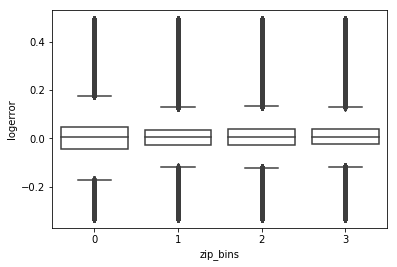

In [81]:
ax = sns.boxplot(x="zip_bins", y="logerror", data=df_features,
        showcaps=True,boxprops={'facecolor':'None'},
        showfliers=True,whiskerprops={'linewidth':0})

In [82]:
sns.set(style="whitegrid", palette="muted")

# "Melt" the dataset to "long-form" representation
df_melt = pd.melt(df_features[['zip_bins','logerror','totsqft', 'latitude']], 
                  "zip_bins", var_name="measurement")

In [ ]:
# I couldn't get this one to finish running, either.
plt.figure(figsize=(8,6))
# Draw a categorical scatterplot to show each observation
p = sns.swarmplot(x="measurement", y="value", hue="zip_bins",
              palette=["r", "c", "y"], data=df_melt)
p.set(yscale="log")

plt.show()

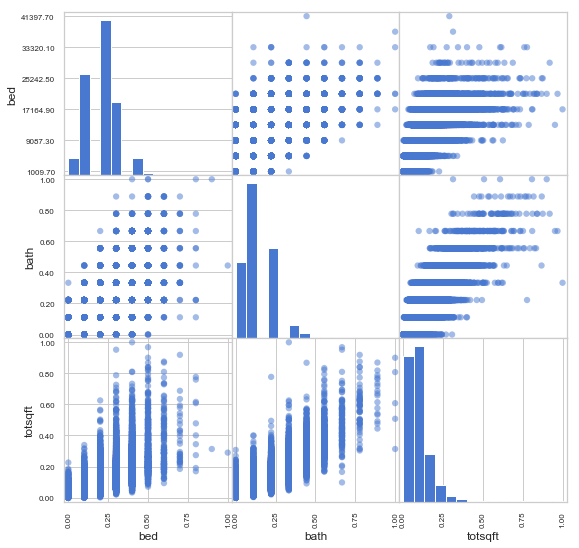

In [84]:
cmap = cm.get_cmap('gnuplot')
axes = pd.scatter_matrix(
    df_features[['bed','bath','totsqft']], marker='o', s=40,
    hist_kwds={'bins':15},  figsize=(9,9), cmap=cmap)
for ax in axes.flatten():
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))